# June ??, 2021

**Motivation**: Spatially homogenous parcellation **(fMRI)**. </br>

In [1]:
# HIDE CODE


import os
import ants
import nrrd

import sys
import collections
import numpy as np
import pandas as pd
import nibabel as nib
import networkx as nx
import operator as op
from os.path import join as pjoin

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

# GitHub
git_path = pjoin(os.environ['HOME'], 'Dropbox/git/Ca-fMRI/')
sys.path.insert(0, git_path)
from utils.processing import *

# Allen
allen_ws = pjoin(os.environ['HOME'], 'Documents/workspaces/allen')
allen_path = pjoin(allen_ws, 'MouseConnectivity')
os.makedirs(allen_path, exist_ok=True)
from allensdk.core.mouse_connectivity_cache import MouseConnectivityCache
from allensdk.api.queries.ontologies_api import OntologiesApi
from allensdk.core.structure_tree import StructureTree

In [2]:
# HIDE CODE


def trim_axs(axes, n):
    axs = axes.flat
    for ax in axs[n:]:
        ax.remove()
    return axs[:n]


def add_children(g: nx.DiGraph(), structure_tree: StructureTree, src_id: int, level: int):
    src = structure_tree.get_structures_by_id([src_id])[0]
    children = structure_tree.children([src_id])[0]
    for child in children:
        src_name = '\n'.join(src['name'].split(' '))
        tgt_name = '\n'.join(child['name'].split(' '))
        g.add_node(tgt_name, lvl=level)
        g.add_edge(src_name, tgt_name)
    return g, children


def make_tree_graph(root: str, n_levels: int = 3, structure_tree: StructureTree = None):
    if structure_tree is None:
        mcc = MouseConnectivityCache(resolution=100)
        structure_tree = mcc.get_structure_tree()
    structure = structure_tree.get_structures_by_name([root])[0]
    
    g = nx.DiGraph()
    g.add_node('\n'.join(structure['name'].split(' ')), lvl=0)

    dend = {}
    for lvl in range(n_levels):
        if lvl == 0:
            src_ids = [structure['id']]
        else:
            new_leaves = []
            for i in src_ids:
                g, children = add_children(g, structure_tree, i, lvl)
                for child in children:
                    new_leaves.append(child['id'])
            src_ids = new_leaves
        dend[lvl] = src_ids
 
    return g, dend


def reorient_arr(x: np.ndarray, tr_axes: Tuple = (2, 1, 0)):
    if len(x.shape) == 4:
        tr_axes += (3,)
    return np.transpose(x, tr_axes)[::-1]



In [3]:
import allensdk
print(allensdk.__version__)

2.11.2


## Make nx tree

In [4]:
from networkx.drawing.nx_agraph import write_dot, graphviz_layout

lvl2c = {
    0: 'C7',
    1: 'lightskyblue',
    2: 'gold',
    3: 'yellowgreen',
}

### 4 levels

In [5]:
n_levels = 4
root = 'Cerebrum'
g, dend = make_tree_graph(root, n_levels)
dend

{0: [567],
 1: [688, 623],
 2: [695, 703, 477, 803],
 3: [315,
  698,
  1089,
  16,
  583,
  942,
  131,
  295,
  319,
  780,
  485,
  493,
  275,
  278,
  818,
  835,
  826,
  809]}

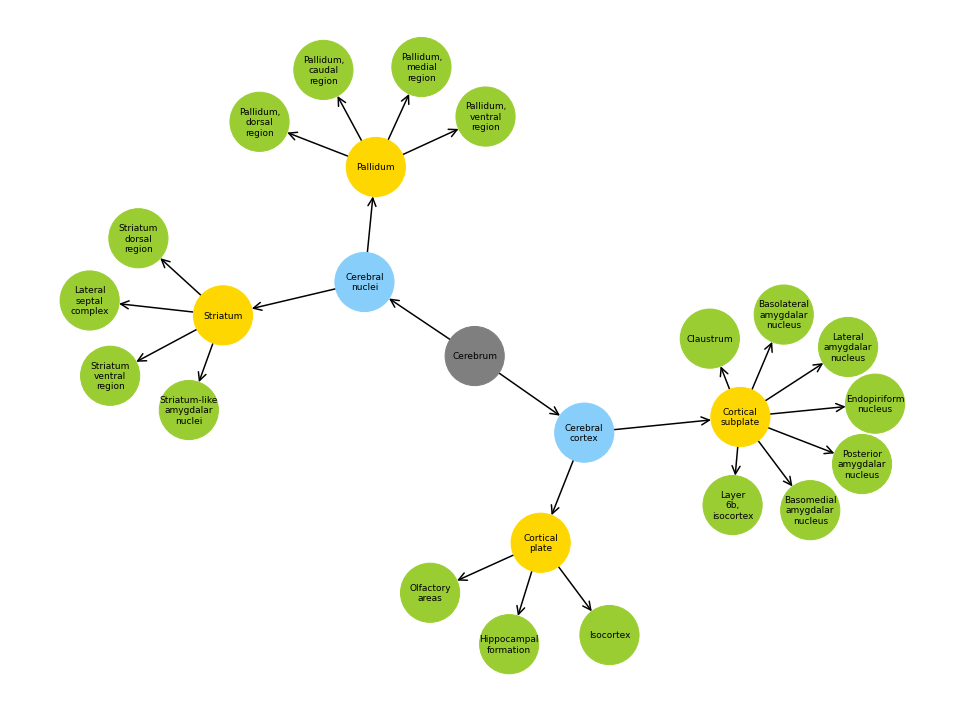

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(13.5, 10))

pos = graphviz_layout(g, prog='neato', root='Cerebrum')
node2c = {i: lvl2c[n[1]['lvl']] for i, n in enumerate(g.nodes(data=True))}
nx.draw(
    G=g,
    pos=pos,
    with_labels=True,
    arrows=True,
    arrowsize=20,
    arrowstyle='->',
    width=1.5,
    node_size=3500,
    font_size=9,
    edge_color='k',
    node_color=node2c.values(),
    ax=ax,
)
fig.tight_layout()
# fig.savefig('cerebrum_3lvls.pdf', dpi=300, bbox_inches='tight')
plt.show()

## Load other data

In [7]:
manifest_file = pjoin(allen_ws, 'MouseConnectivity', 'manifest.json')
mcc = MouseConnectivityCache(resolution=100, manifest_file=manifest_file)
structure_tree = mcc.get_structure_tree()

root = structure_tree.get_structures_by_name(['root'])[0]
cerebrum = structure_tree.get_structures_by_name(['Cerebrum'])[0]
isocortex = structure_tree.get_structures_by_name(['Isocortex'])[0]

In [8]:
all_experiments = mcc.get_experiments(dataframe=True)
selected_experiments = all_experiments.loc[all_experiments.structure_abbrev == 'SSp-bfd']
experiment_id = 657041814

# download the projection density volume for one of the experiments
pjd, pjd_info = mcc.get_projection_density(experiment_id)

# injection density: number of projecting pixels in injection site / voxel volume
ind, ind_info = mcc.get_injection_density(experiment_id)

# injection fraction: number of pixels in injection site / voxel volume
inf, inf_info = mcc.get_injection_fraction(experiment_id)

# binary mask indicating which voxels contain valid data
dm, dm_info = mcc.get_data_mask(experiment_id)

# template and annotation info
template, template_info = mcc.get_template_volume()
annot, annot_info = mcc.get_annotation_volume()

# in addition to the annotation volume, you can get binary masks for individual structures
root_mask, root_mask_info = mcc.get_structure_mask(root['id'])
cerebrum_mask, cerebrum_mask_info = mcc.get_structure_mask(cerebrum['id'])
cortex_mask, cortex_mask_info = mcc.get_structure_mask(isocortex['id'])

In [9]:
from prettytable import PrettyTable
table = PrettyTable(field_names=['lvl', 'name', '# voxels', 'relative sz'])


m0 = mcc.get_structure_mask(cerebrum['id'])[0]

names = collections.defaultdict(list)
for lvl, struct_ids in dend.items():
    for struct_id in struct_ids:
        name = structure_tree.get_structures_by_id([struct_id])[0]['name']
        if name == 'Layer 6b, isocortex':
            continue
        names[lvl].append(name)
        m1 = mcc.get_structure_mask(struct_id)[0]
        
        table.add_row([lvl, name, m1.sum(), '{:.1f} {:s}'.format(m1.sum() / m0.sum() * 100, '%')])
        
    if lvl < len(dend) - 1:
        table.add_row([''] * len(table.field_names))

names = dict(names)
print(table)

+-----+--------------------------------+----------+-------------+
| lvl |              name              | # voxels | relative sz |
+-----+--------------------------------+----------+-------------+
|  0  |            Cerebrum            |  275611  |   100.0 %   |
|     |                                |          |             |
|  1  |        Cerebral cortex         |  221252  |    80.3 %   |
|  1  |        Cerebral nuclei         |  54359   |    19.7 %   |
|     |                                |          |             |
|  2  |         Cortical plate         |  212402  |    77.1 %   |
|  2  |       Cortical subplate        |   8850   |    3.2 %    |
|  2  |            Striatum            |  45063   |    16.4 %   |
|  2  |            Pallidum            |   9296   |    3.4 %    |
|     |                                |          |             |
|  3  |           Isocortex            |  123245  |    44.7 %   |
|  3  |        Olfactory areas         |  46478   |    16.9 %   |
|  3  |   

--------------------------------------------------------------------------------


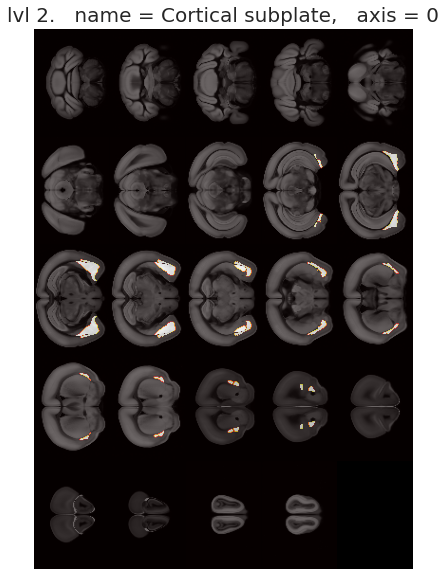

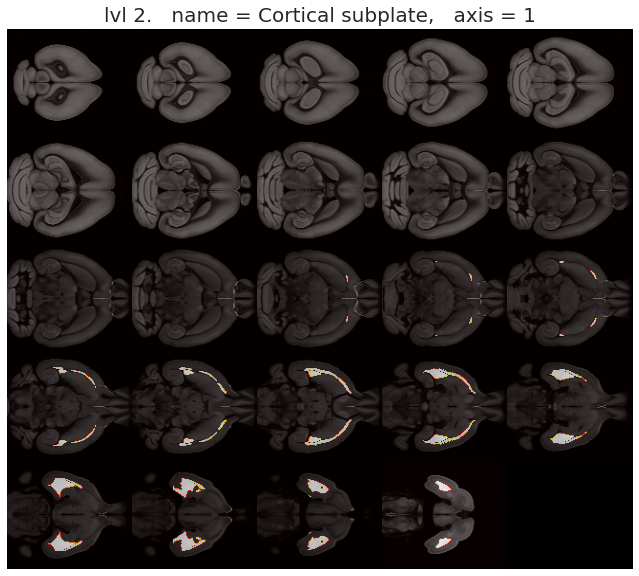

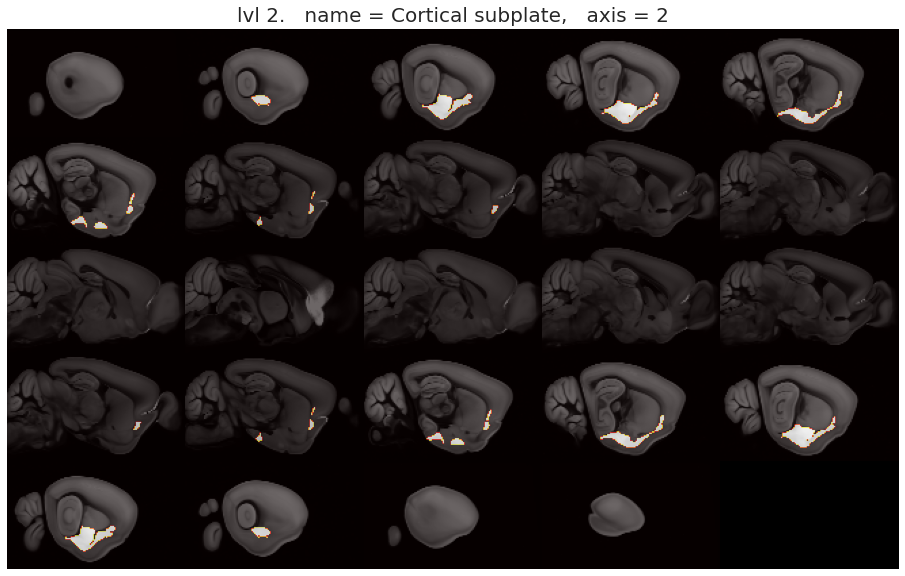

--------------------------------------------------------------------------------



--------------------------------------------------------------------------------


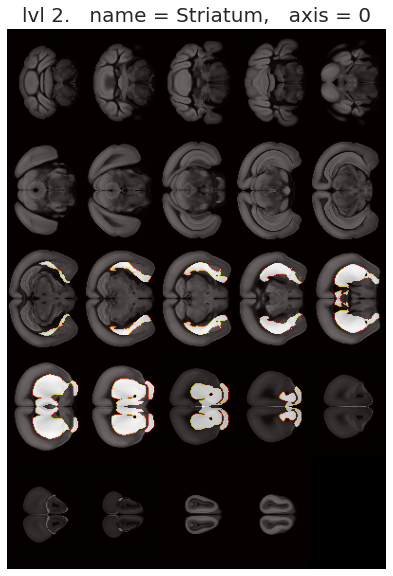

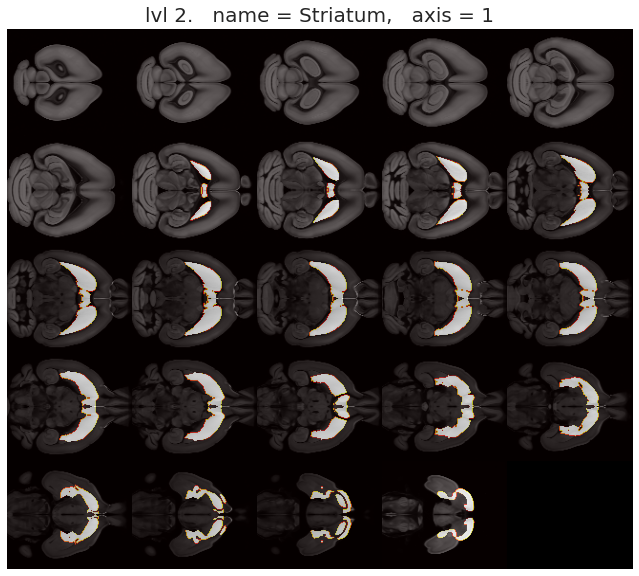

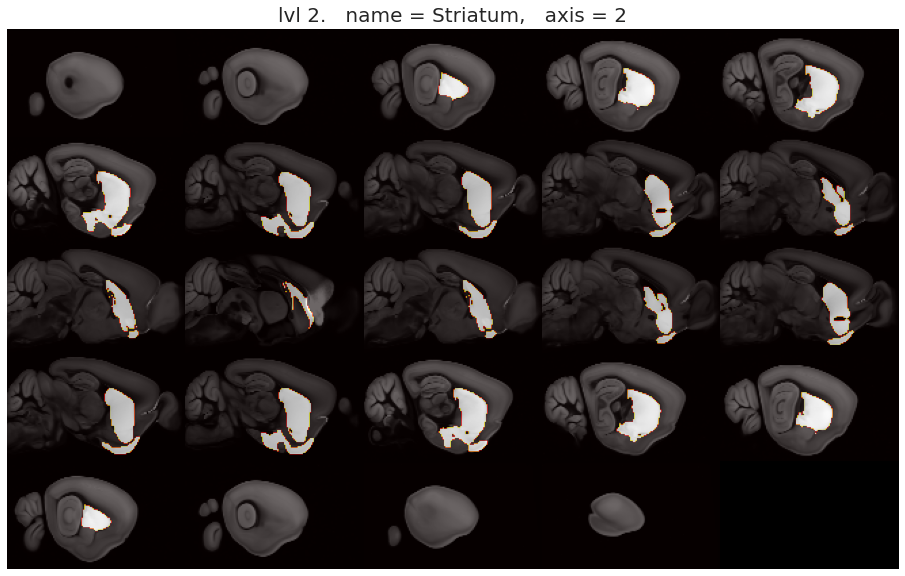

--------------------------------------------------------------------------------



--------------------------------------------------------------------------------


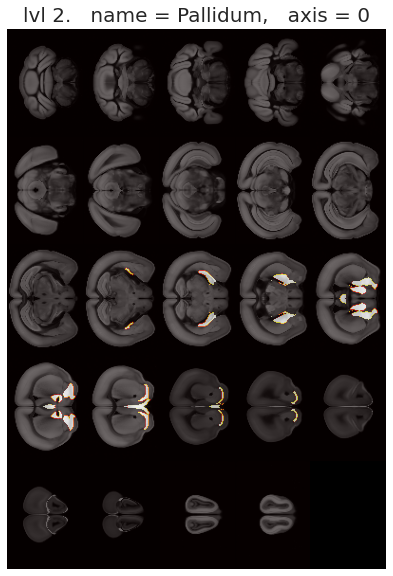

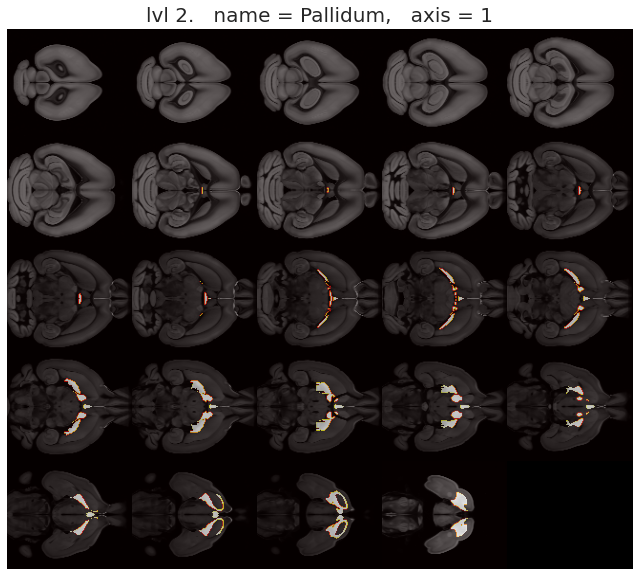

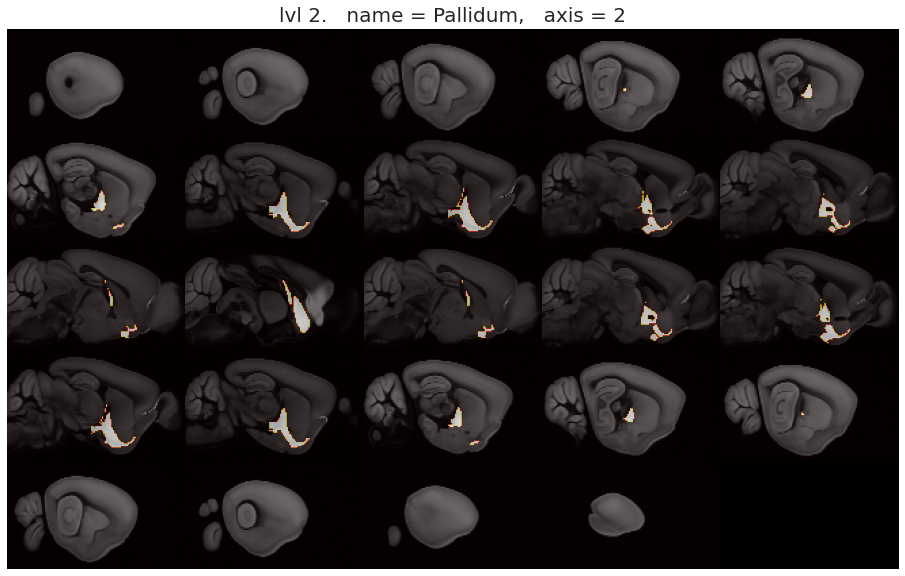

--------------------------------------------------------------------------------



--------------------------------------------------------------------------------


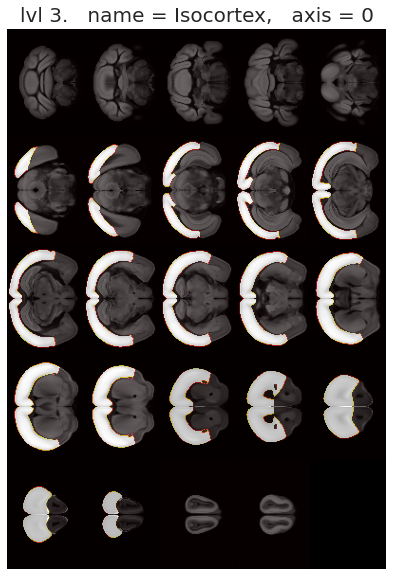

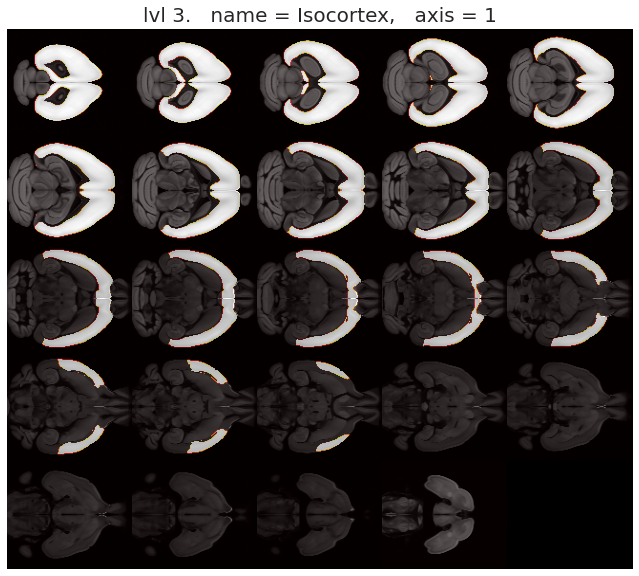

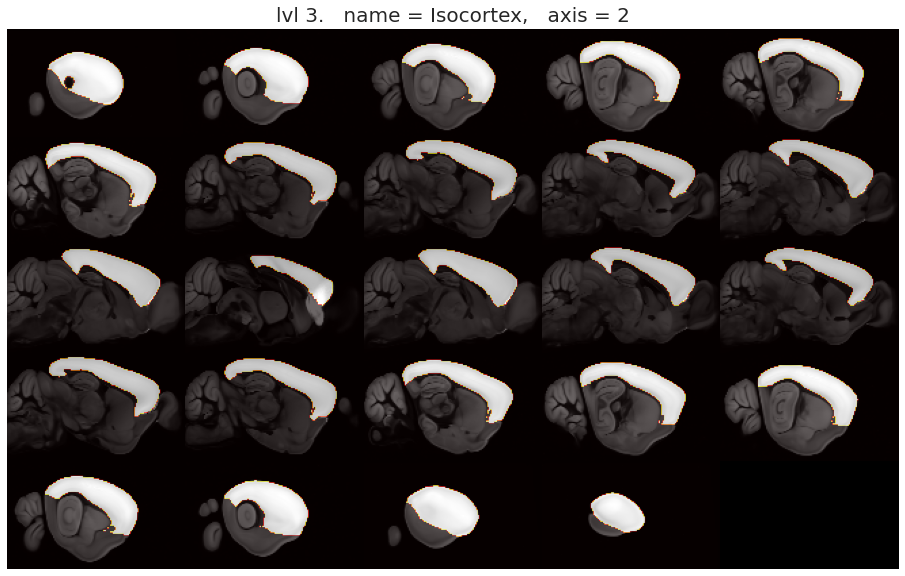

--------------------------------------------------------------------------------



--------------------------------------------------------------------------------


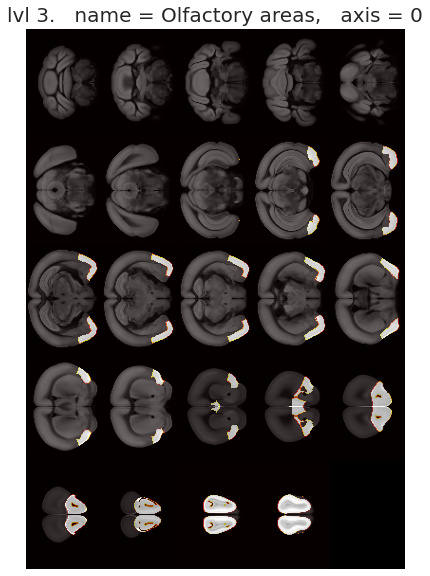

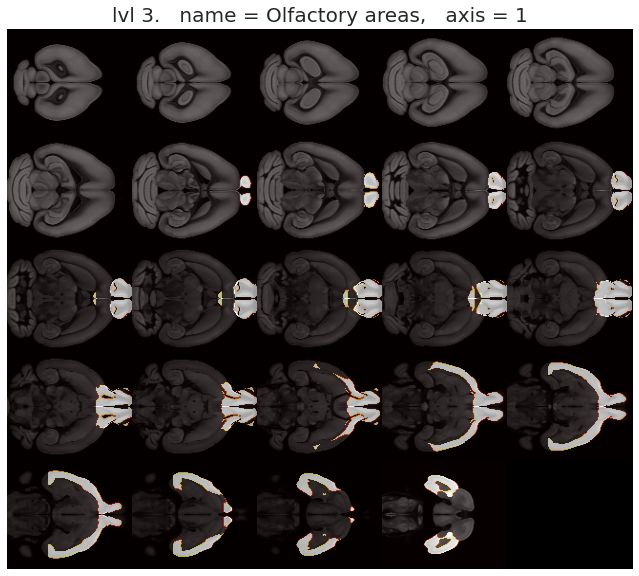

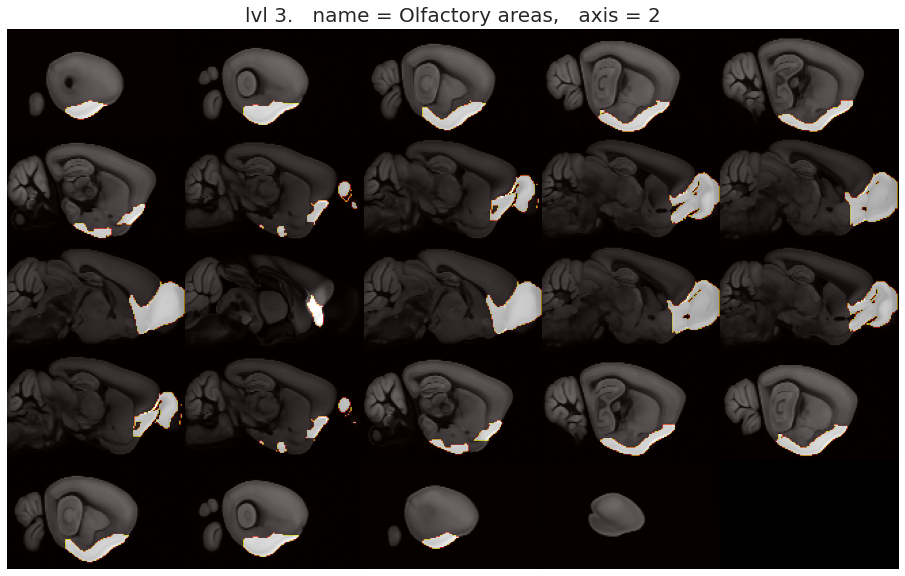

--------------------------------------------------------------------------------



--------------------------------------------------------------------------------


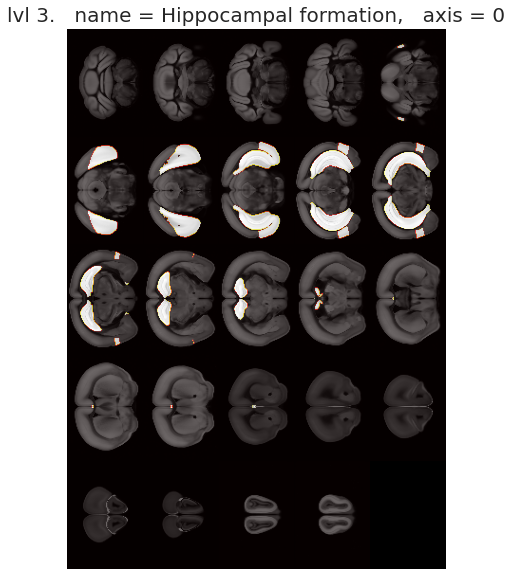

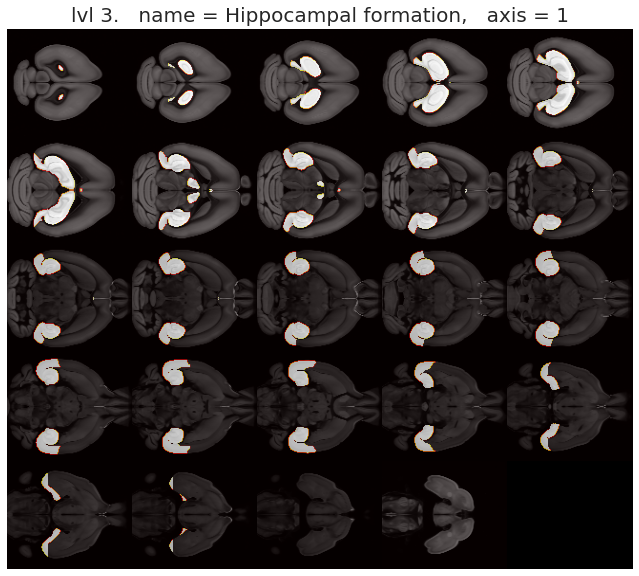

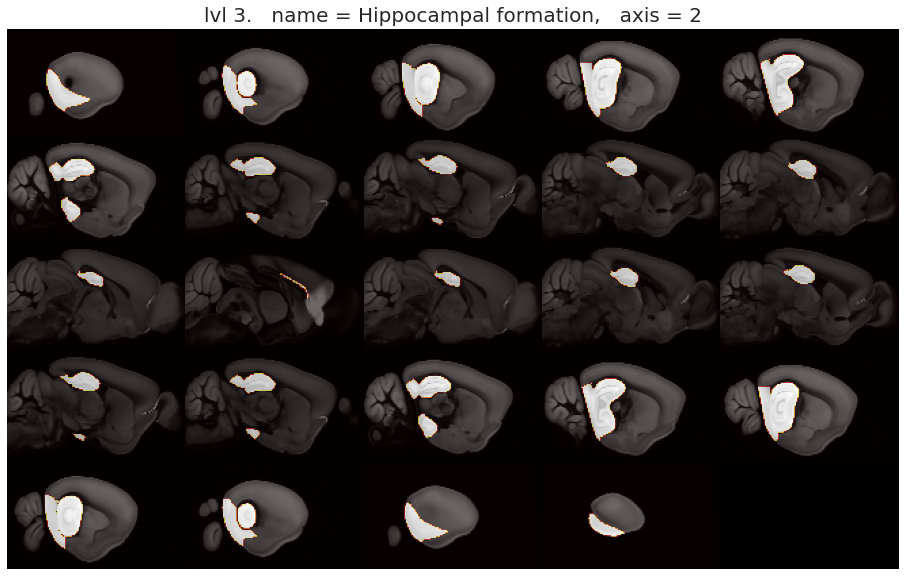

--------------------------------------------------------------------------------





In [10]:
selected_names = [
    'Cortical subplate',
    'Striatum',
    'Pallidum',
    'Isocortex',
    'Olfactory areas',
    'Hippocampal formation',
]

for lvl, name_list in names.items():
    for name in name_list:
        
        if name not in selected_names:
            continue
        
        _structure = structure_tree.get_structures_by_name([name])[0]
        _mask, _info = mcc.get_structure_mask(_structure['id'])

        print('-' * 80)
        for axis in range(3):
            ants.from_numpy(template.astype(float)).plot(
                axis=axis,
                nslices=24,
                overlay=ants.from_numpy(_mask),
                overlay_cmap='hot',
                overlay_alpha=0.6,
                title='lvl {:d}.   name = {:s},   axis = {:d}'.format(lvl, name, axis),
            )
        print('-' * 80)
        print('\n\n')

## Spatial normalization using ANTs

In [11]:
config = Config()

func = {}
for subject in tqdm(range(1, config.num_subjects+1), leave=False):
    for session in tqdm(range(1, config.num_sessions+1), leave=False):
        if subject != 6 or session != 1:
            continue
            
        keywords = [
            'sub-SLC{:02d}'.format(subject),
            'ses-{:d}'.format(session),
            'space-individual',
        ]
                
        # func
        for run in range(1, config.num_runs+1):
            kws_func = keywords + ['run-{:d}'.format(run), 'task-rest', 'bold']
            gen = (x for x in sorted(os.listdir(config.raw_dir)) if all(k in x for k in kws_func))
            try:
                func_file = pjoin(config.raw_dir, next(gen))
            except StopIteration:
                continue
            x = nib.load(func_file).get_fdata()
            func[run] = reorient_arr(x)
        
        # anat
        kws_anat = keywords + ['T1w']
        gen = (x for x in sorted(os.listdir(config.raw_dir)) if all(k in x for k in kws_anat))
        anat_file = pjoin(config.raw_dir, next(gen))
        
        # mask
        kws_mask = keywords + ['desc-mask', 'bold']
        gen = (x for x in sorted(os.listdir(config.raw_dir)) if all(k in x for k in kws_mask))
        mask_file = pjoin(config.raw_dir, next(gen))
        
        # load anat and mask and reorient
        moving = nib.load(anat_file).get_fdata()
        mask = nib.load(mask_file).get_fdata()
        moving *= mask
        
        moving = reorient_arr(moving)
        moving_mask = ants.from_numpy(moving).get_mask().numpy()

# images in CCF space
fixed, CH_mask, ISO_mask = [
    ants.resample_image(ants.from_numpy(arr.astype(float)), [2]*3).numpy().astype(float)
    for arr in [template, cerebrum_mask, cortex_mask]
]
moving, moving_mask, fixed, CH_mask, ISO_mask = [
    ants.from_numpy(arr, origin=[0]*3, spacing=[1.0]*3)
    for arr in [moving, moving_mask, fixed, CH_mask, ISO_mask]
]

moving.shape, moving_mask.shape, fixed.shape, CH_mask.shape, ISO_mask.shape, func[1].shape

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

((78, 64, 64),
 (78, 64, 64),
 (66, 40, 57),
 (66, 40, 57),
 (66, 40, 57),
 (78, 64, 64, 600))

### Register

In [12]:
tx = ants.registration(
    fixed=fixed,
    moving=moving,
    mask=moving_mask,
    type_of_transform='SyN',
    verbose=True,
)

In [13]:
from prettytable import PrettyTable
table = PrettyTable(field_names=['interpolator', 'MI(fixed, warped) / MI(fixed, fixed)'])

interpolators = [
    'nearestNeighbor',
    'lanczosWindowedSinc',
    'gaussian',
    'genericLabel',
    'bSpline',
    'hammingWindowedSinc',
    'linear',
    'welchWindowedSinc',
    'multiLabel',
]

for interpolator in interpolators:
    warped = ants.apply_transforms(
        fixed=fixed,
        moving=moving,
        transformlist=tx['fwdtransforms'],
        interpolator=interpolator,
    )
    rel_mi = ants.image_mutual_information(fixed, warped) / ants.image_mutual_information(fixed, fixed)
    table.add_row([interpolator, np.round(rel_mi, decimals=3)])

print(table)

+---------------------+--------------------------------------+
|     interpolator    | MI(fixed, warped) / MI(fixed, fixed) |
+---------------------+--------------------------------------+
|   nearestNeighbor   |                0.444                 |
| lanczosWindowedSinc |                0.462                 |
|       gaussian      |                0.485                 |
|     genericLabel    |                0.449                 |
|       bSpline       |                0.464                 |
| hammingWindowedSinc |                0.464                 |
|        linear       |                0.476                 |
|  welchWindowedSinc  |                0.462                 |
|      multiLabel     |                0.359                 |
+---------------------+--------------------------------------+


In [14]:
warped = ants.apply_transforms(
    fixed=fixed,
    moving=moving,
    transformlist=tx['fwdtransforms'],
    interpolator='linear',
)
warped

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (66, 40, 57)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

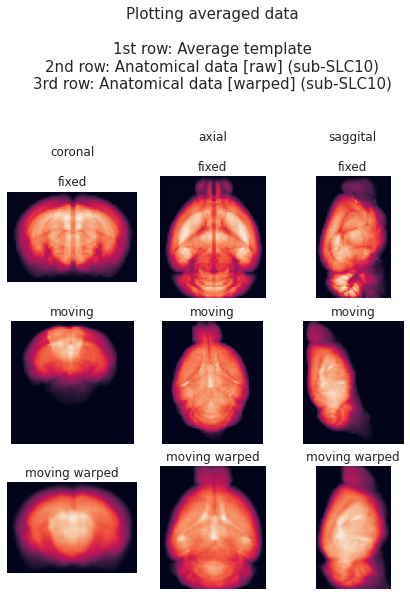

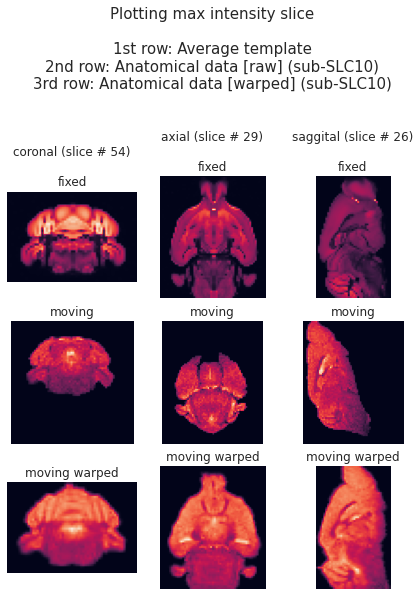

In [15]:
sns.set_style('white')
fig, axes = plt.subplots(3, 3, figsize=(6, 8))

for i in range(3):
    for j in range(3):       
        if i == 0:
            x = fixed.numpy()
            title = 'fixed'
        elif i == 1:
            x = moving.numpy()
            title = 'moving'
        else:
            x = warped.numpy()
            title = 'moving warped'

        if i == 0:
            if j == 0:
                top_title = 'coronal\n\n'
            elif j == 1:
                top_title = 'axial\n\n'
            else:
                top_title = 'saggital\n\n'
            title = top_title + title
        
        # data2plt = x.take(max_slice, axis=j)
        data2plt = x.mean(j)
        axes[i, j].imshow(data2plt)
        axes[i, j].set_title(title)
        axes[i, j].axis('off')

msg = 'Plotting averaged data\n\n'
msg += '1st row: Average template\n'
msg += '2nd row: Anatomical data [raw] (sub-SLC{:02d})\n'
msg += '3rd row: Anatomical data [warped] (sub-SLC{:02d})'
plt.suptitle(msg.format(subject, subject), fontsize=15, y=1.03)
plt.tight_layout()
plt.show()


print('\n')


sns.set_style('white')
fig, axes = plt.subplots(3, 3, figsize=(6, 8))

for i in range(3):
    for j in range(3):       
        if i == 0:
            x = fixed.numpy()
            title = 'fixed'
        elif i == 1:
            x = moving.numpy()
            title = 'moving'
        else:
            x = warped.numpy()
            title = 'moving warped'

        max_slice = np.abs(fixed.numpy()).reshape(-1, fixed.shape[j]).mean(0).argmax()
        
        if i == 0:
            if j == 0:
                top_title = 'coronal (slice # {:d})\n\n'
            elif j == 1:
                top_title = 'axial (slice # {:d})\n\n'
            else:
                top_title = 'saggital (slice # {:d})\n\n'
            title = top_title.format(max_slice) + title
        
        data2plt = x.take(max_slice, axis=j)
        # data2plt = x.mean(j)
        axes[i, j].imshow(data2plt)
        axes[i, j].set_title(title)
        axes[i, j].axis('off')

msg = 'Plotting max intensity slice\n\n'
msg += '1st row: Average template\n'
msg += '2nd row: Anatomical data [raw] (sub-SLC{:02d})\n'
msg += '3rd row: Anatomical data [warped] (sub-SLC{:02d})'
plt.suptitle(msg.format(subject, subject), fontsize=15, y=1.03)
plt.tight_layout()
plt.show()

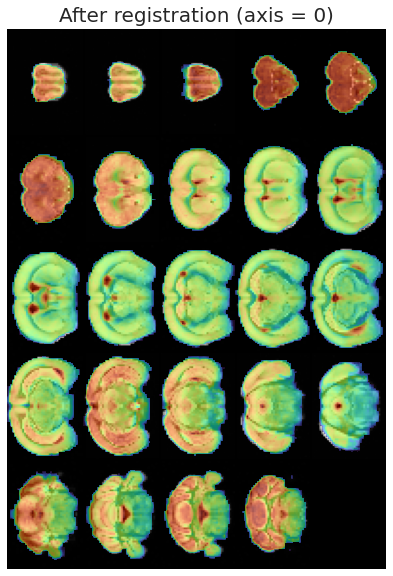

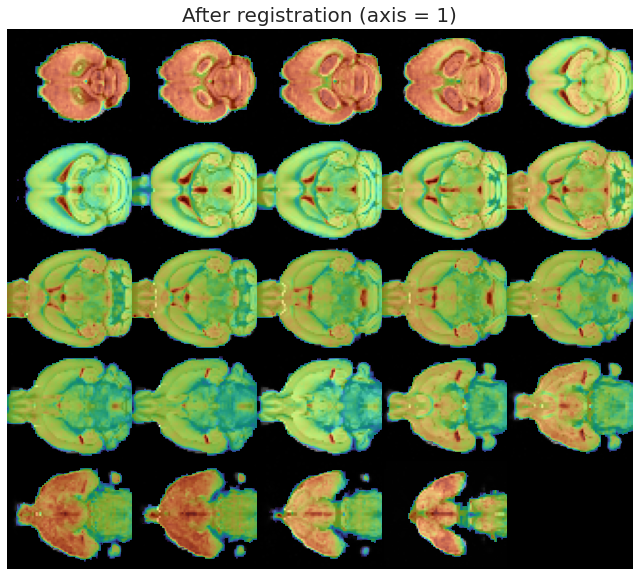

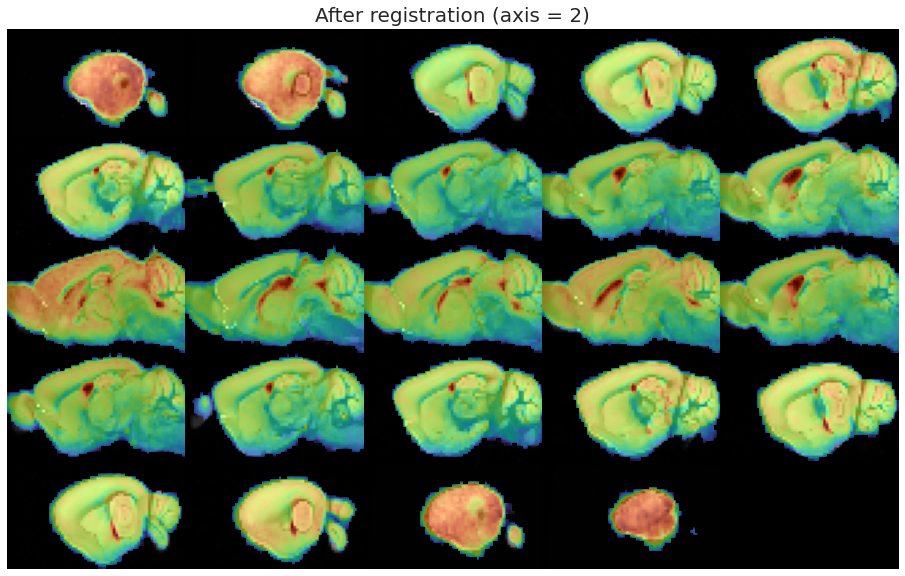

In [16]:
for axis in range(3):
    fixed.plot(
        overlay=warped,
        nslices=24,
        overlay_alpha=0.6,
        overlay_cmap='turbo',
        axis=axis,
        figsize=1.5,
        reorient=False,
        title='After registration (axis = {:d})'.format(axis),
    )

### Viz Cerebrum mask on template + Warped

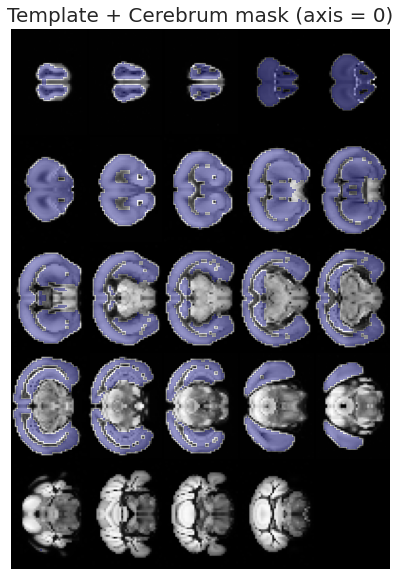

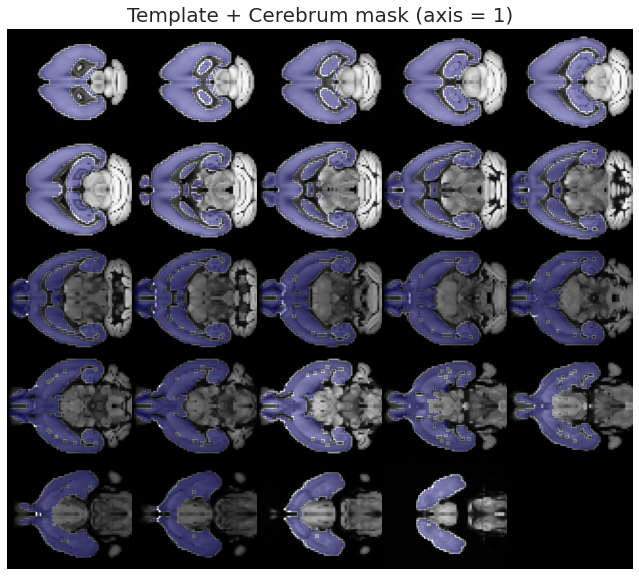

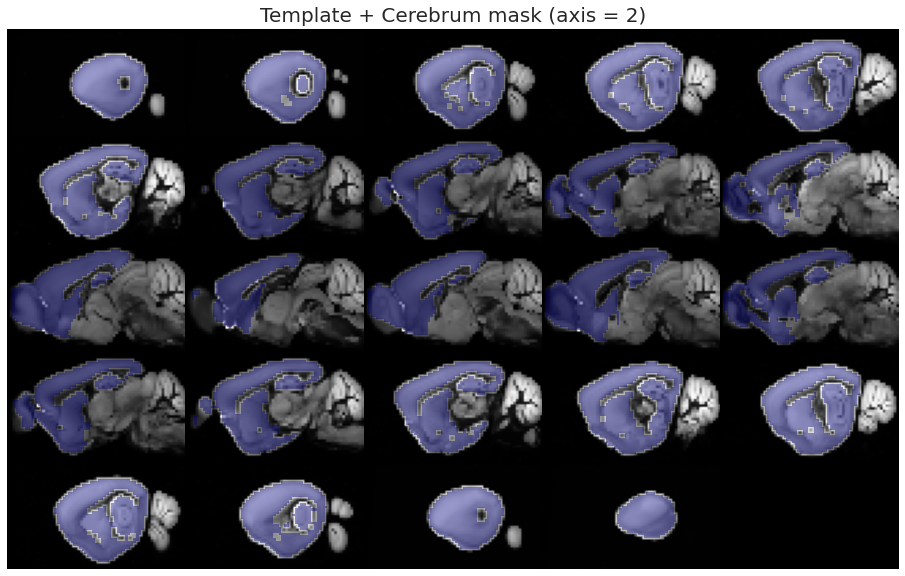

In [17]:
for axis in range(3):
    fixed.plot(
        overlay=CH_mask,
        nslices=24,
        overlay_alpha=0.4,
        axis=axis,
        figsize=1.5,
        reorient=False,
        title='Template + Cerebrum mask (axis = {:d})'.format(axis),
    )

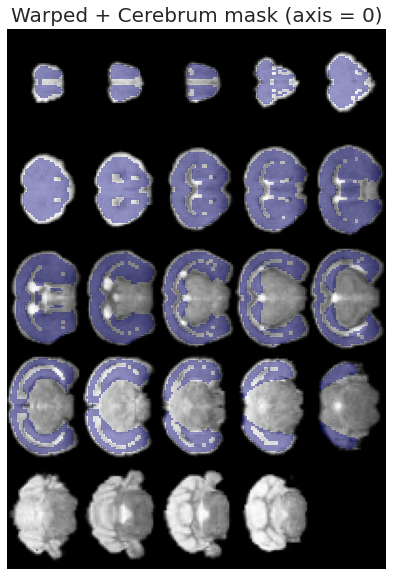

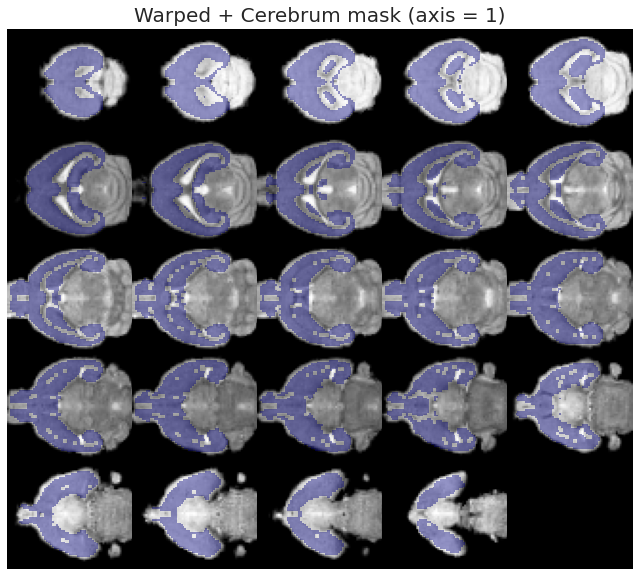

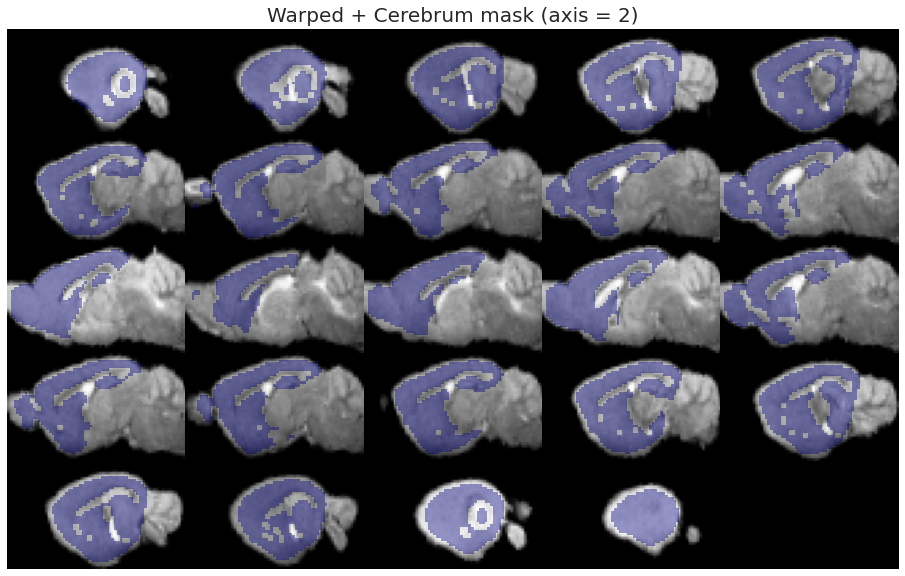

In [18]:
for axis in range(3):
    warped.plot(
        overlay=CH_mask,
        nslices=24,
        overlay_alpha=0.4,
        axis=axis,
        figsize=1.5,
        reorient=False,
        title='Warped + Cerebrum mask (axis = {:d})'.format(axis),
    )

In [19]:
CH_mask_inv = ants.apply_transforms(
    fixed=moving,
    moving=CH_mask,
    transformlist=tx['invtransforms'],
    interpolator='genericLabel',
)

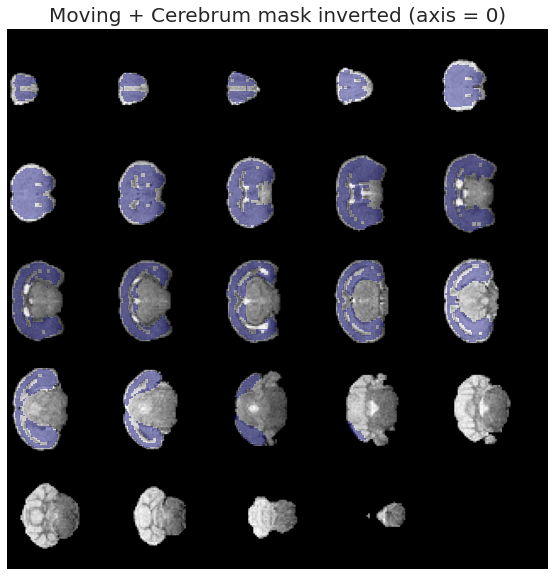

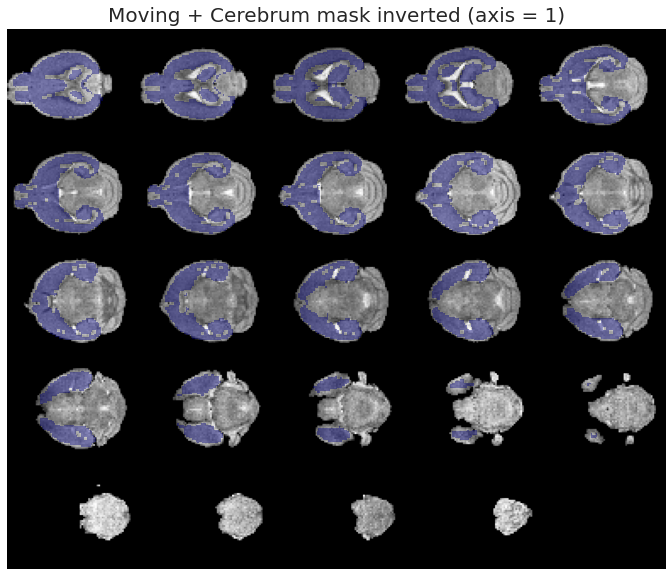

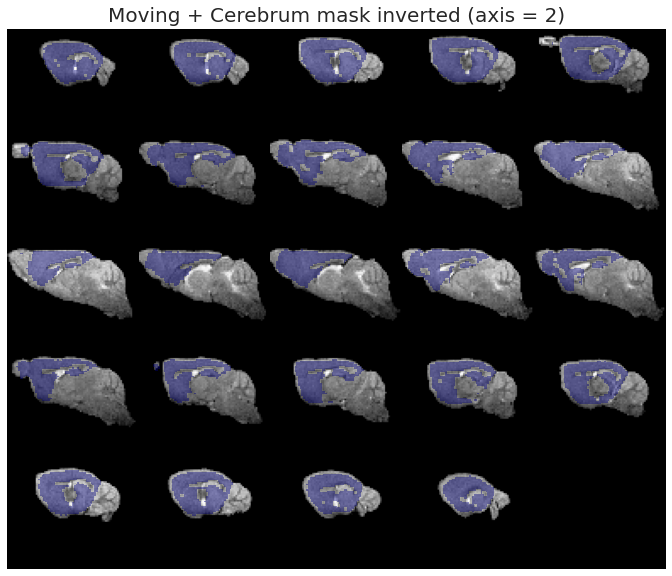

In [20]:
for axis in range(3):
    moving.plot(
        overlay=CH_mask_inv,
        nslices=24,
        overlay_alpha=0.4,
        axis=axis,
        figsize=1.5,
        reorient=False,
        title='Moving + Cerebrum mask inverted (axis = {:d})'.format(axis),
    )

In [21]:
ISO_mask_inv = ants.apply_transforms(
    fixed=moving,
    moving=ISO_mask,
    transformlist=tx['invtransforms'],
    interpolator='genericLabel',
)

ISO_mask.shape, ISO_mask_inv.shape

((66, 40, 57), (78, 64, 64))

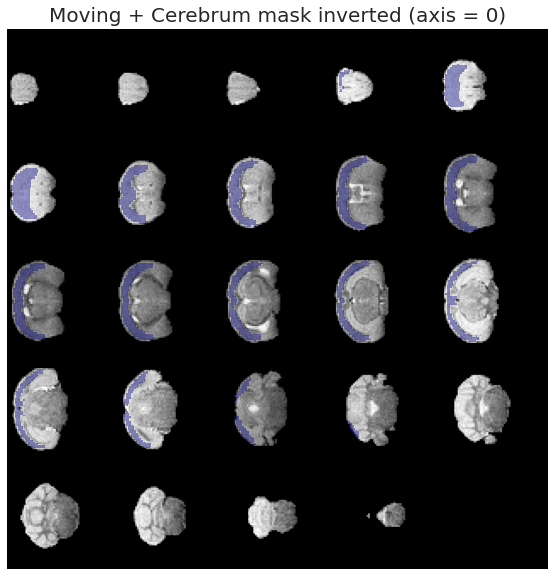

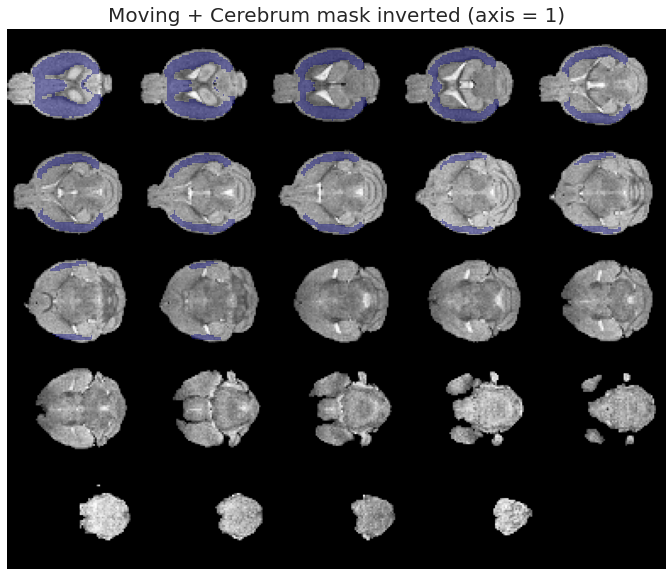

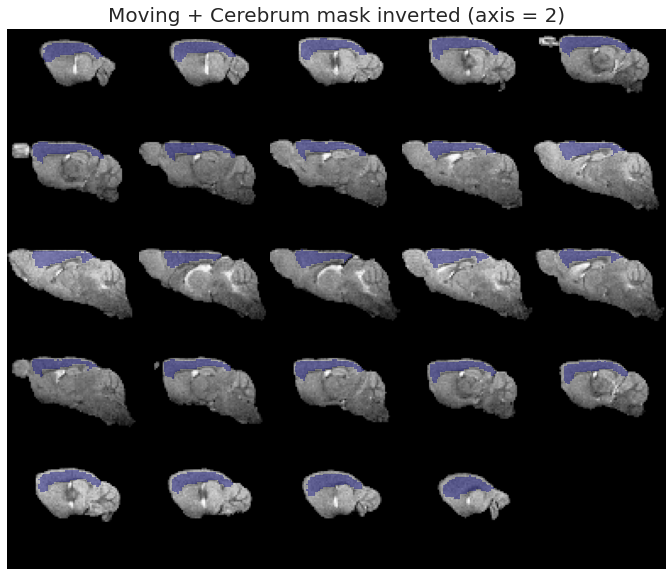

In [22]:
for axis in range(3):
    moving.plot(
        overlay=ISO_mask_inv,
        nslices=24,
        overlay_alpha=0.4,
        axis=axis,
        figsize=1.5,
        reorient=False,
        title='Moving + Cerebrum mask inverted (axis = {:d})'.format(axis),
    )

## Parcellation

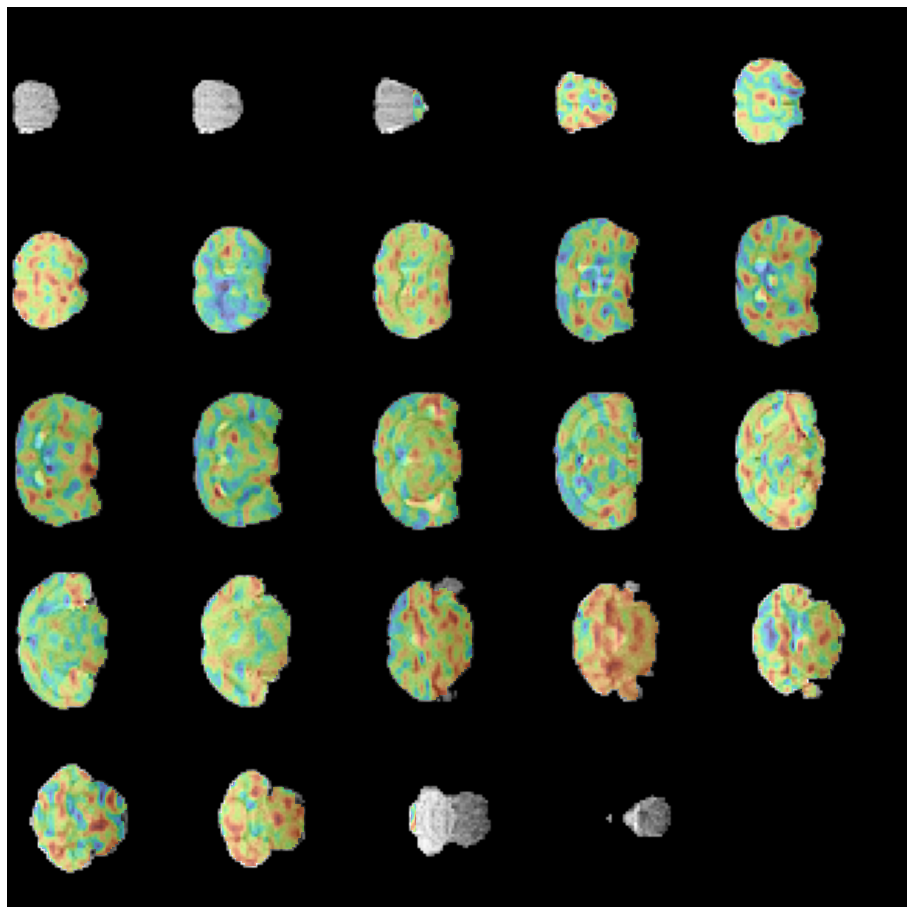

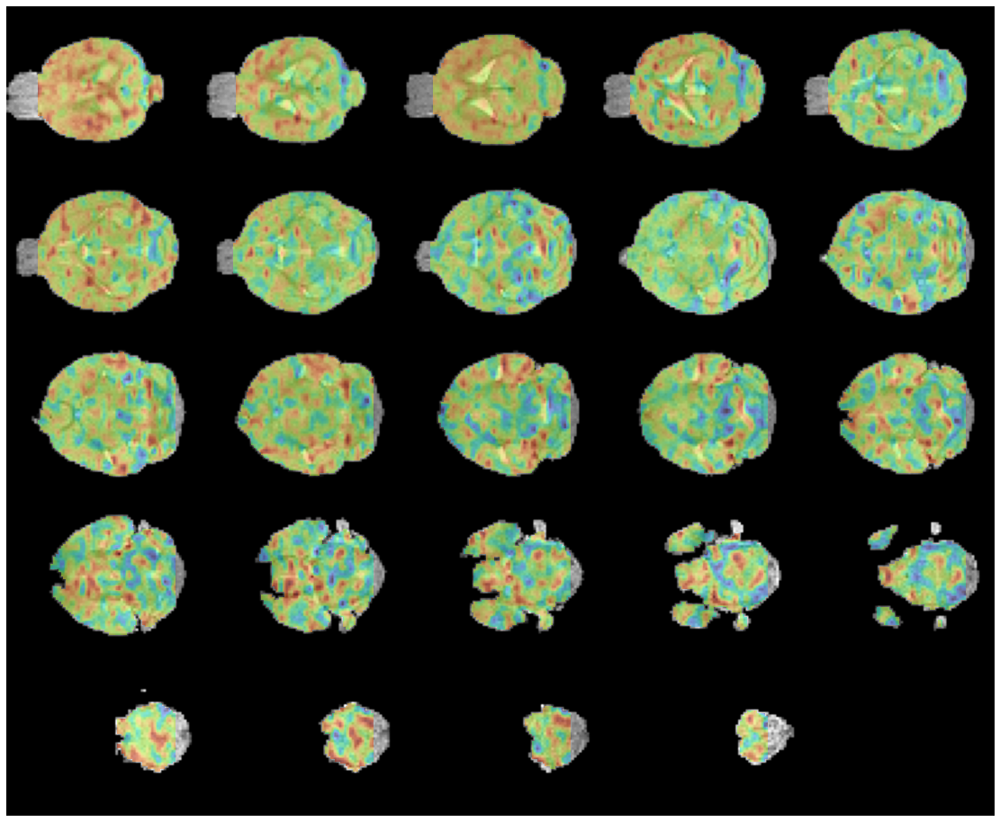

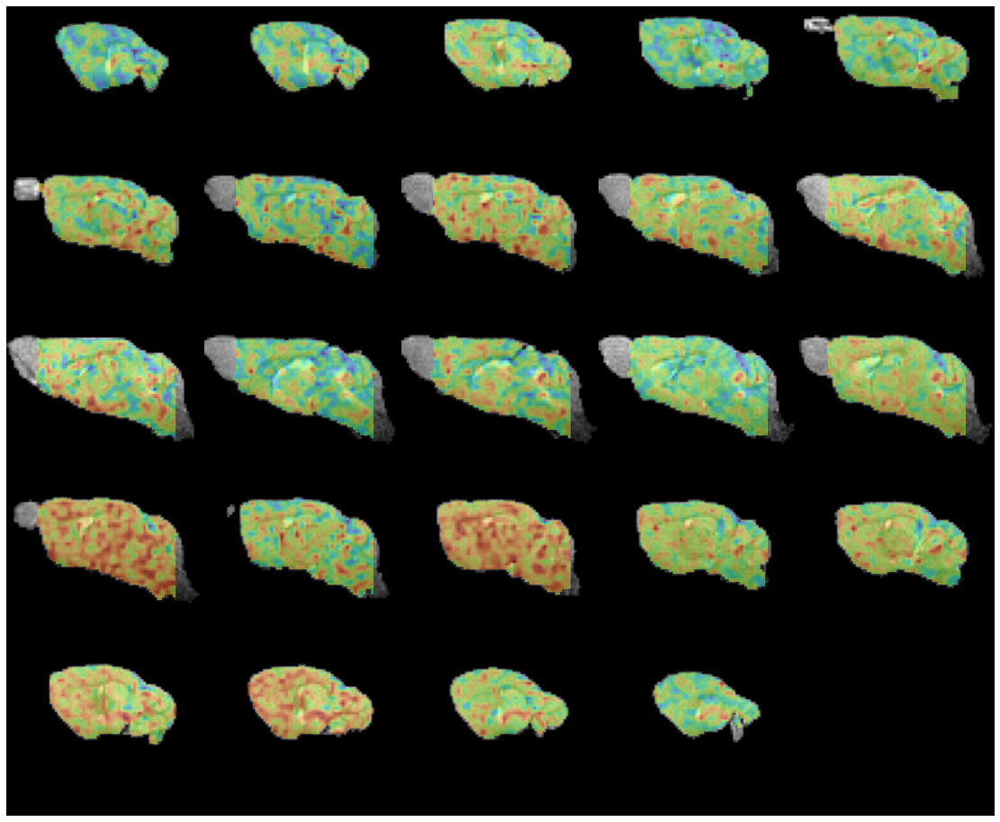

In [23]:
for axis in range(3):
    moving.plot(
        overlay=ants.from_numpy(func[1][..., 300]) * moving_mask,
        overlay_alpha=0.5,
        overlay_cmap='turbo',
        axis=axis,
        nslices=24,
        figsize=2.5,
        reorient=False,
    )

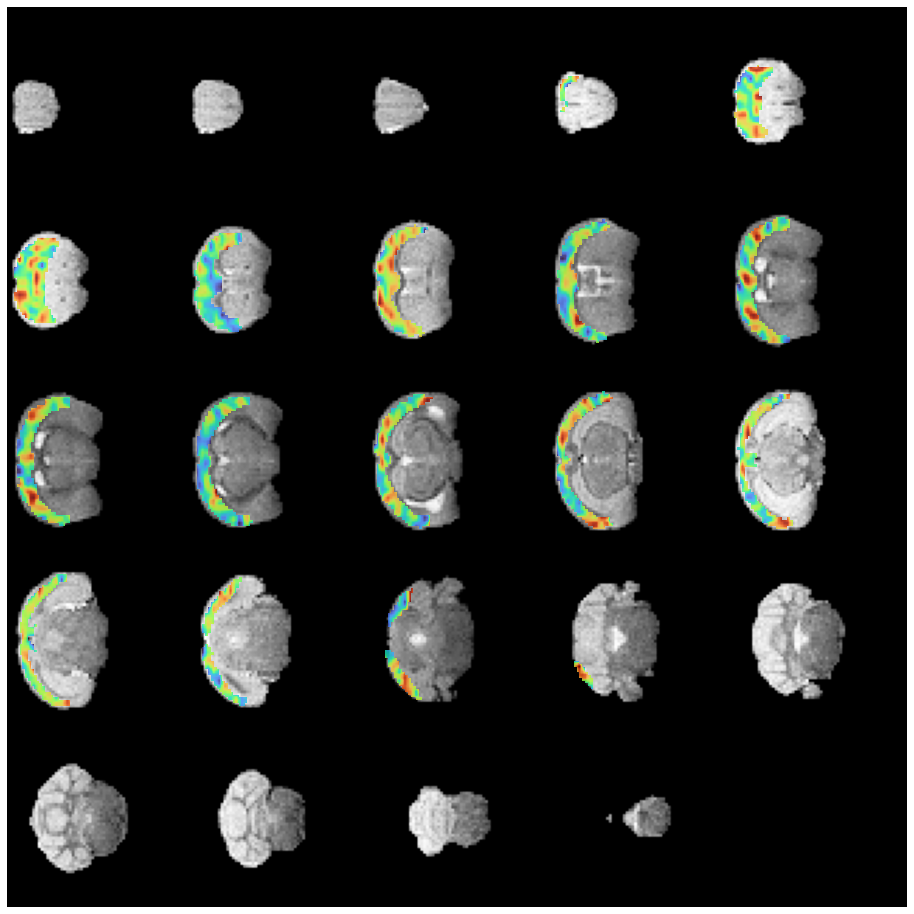

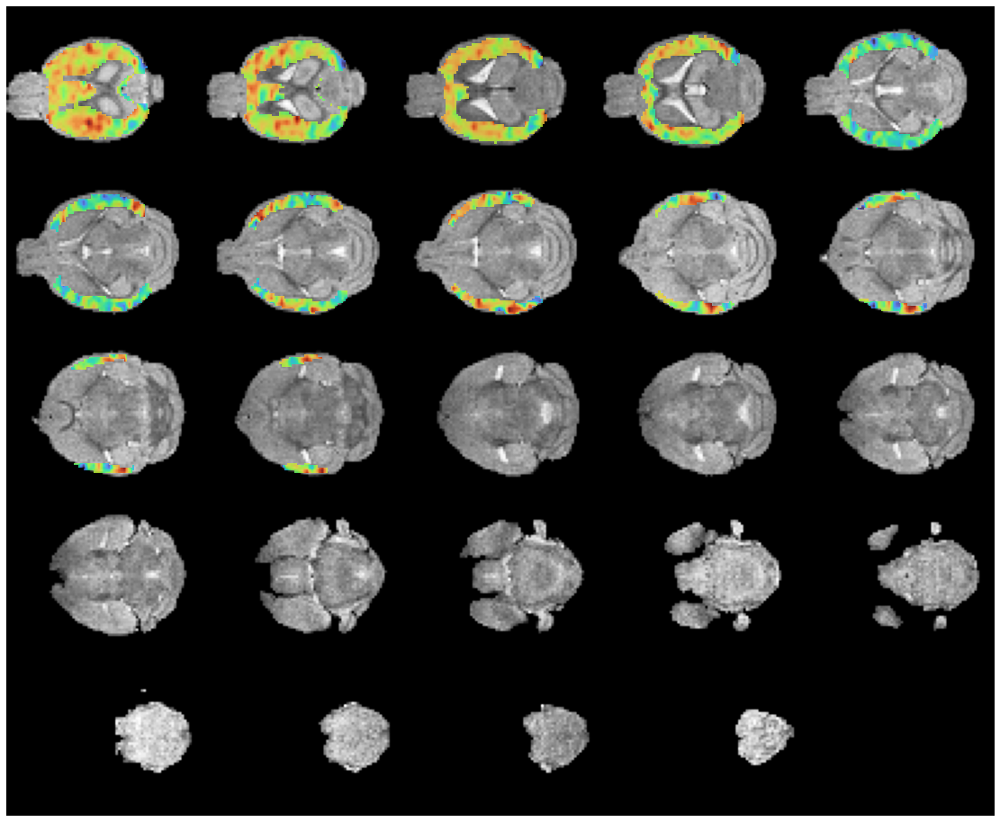

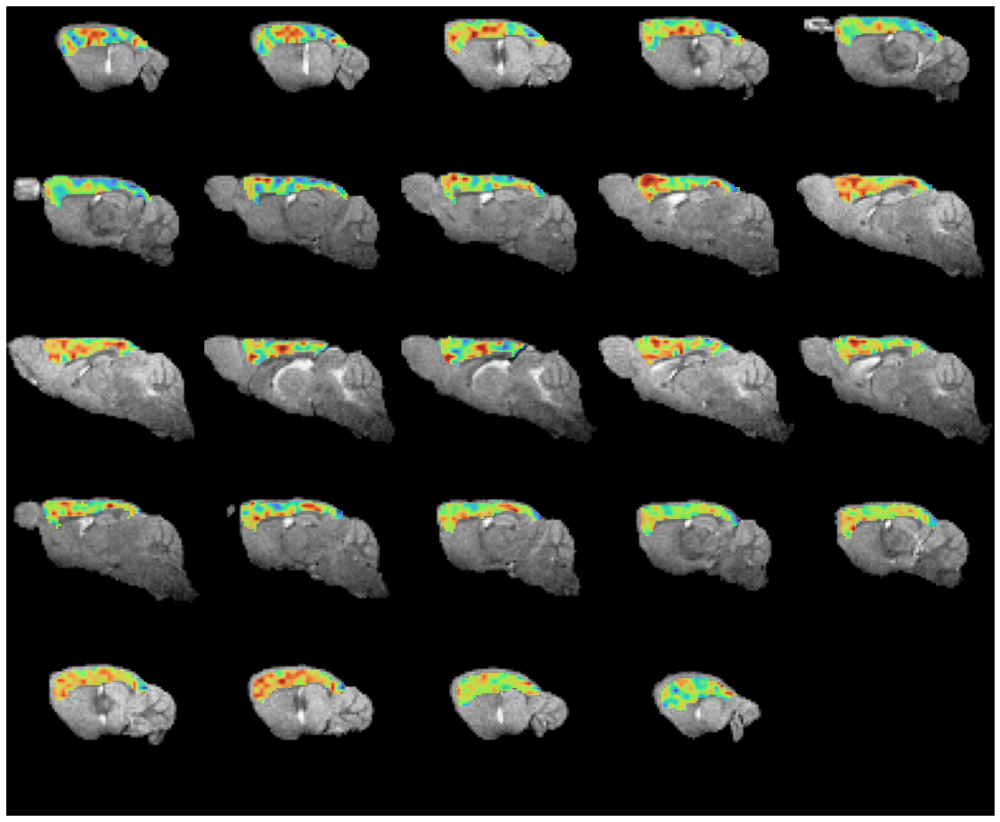

In [24]:
for axis in range(3):
    moving.plot(
        overlay=ants.from_numpy(func[1][..., 300]) * ISO_mask_inv,
        overlay_alpha=0.8,
        overlay_cmap='turbo',
        axis=axis,
        nslices=24,
        figsize=2.5,
        reorient=False,
    )